In [ ]:
!pip install -q gdown

import os, zipfile, random, shutil, textwrap
from glob import glob

!gdown --id 1t5YDg4_X97edTd0q-i82UdhapIgsM1pP -O /content/MergedYOLO.zip
with zipfile.ZipFile("/content/MergedYOLO.zip", 'r') as zip_ref:
    zip_ref.extractall("/content")

IMG_SRC = "/content/images"
LBL_SRC = "/content/labels"

DEST_ROOT = "/content/dataset"
splits = ["train", "val", "test"]
for s in splits:
    os.makedirs(f"{DEST_ROOT}/images/{s}", exist_ok=True)
    os.makedirs(f"{DEST_ROOT}/labels/{s}", exist_ok=True)

img_paths = []
for p in glob(f"{IMG_SRC}/*.jpg"):
    base = os.path.splitext(os.path.basename(p))[0]
    if os.path.exists(f"{LBL_SRC}/{base}.txt"):
        img_paths.append(p)

random.seed(42)
random.shuffle(img_paths)

n = len(img_paths)
n_train = int(0.8 * n)
n_val   = int(0.1 * n)
splits_dict = {
    "train": img_paths[:n_train],
    "val"  : img_paths[n_train:n_train + n_val],
    "test" : img_paths[n_train + n_val:]
}

for split, paths in splits_dict.items():
    for img in paths:
        base = os.path.basename(img)
        lbl  = f"{LBL_SRC}/{os.path.splitext(base)[0]}.txt"
        shutil.copy(img, f"{DEST_ROOT}/images/{split}")
        shutil.copy(lbl, f"{DEST_ROOT}/labels/{split}")

yaml_text = textwrap.dedent(f"""
path: {DEST_ROOT}
train: images/train
val: images/val
test: images/test
nc: 3
names: [fire, smoke, nonfire]
""").strip()

with open("/content/fire_smoke.yaml", "w") as f:
    f.write(yaml_text)

counts = {k: len(v) for k, v in splits_dict.items()}
print("Dataset Split Complete:")
for split in splits:
    print(f"  {split:<5} → Images: {len(os.listdir(f'{DEST_ROOT}/images/{split}'))}, "
          f"Labels: {len(os.listdir(f'{DEST_ROOT}/labels/{split}'))}")
print("YAML saved to: /content/fire_smoke.yaml")


/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1t5YDg4_X97edTd0q-i82UdhapIgsM1pP
From (redirected): https://drive.google.com/uc?id=1t5YDg4_X97edTd0q-i82UdhapIgsM1pP&confirm=t&uuid=04ad845c-0b23-40c2-a644-d64fd6045e83
To: /content/MergedYOLO.zip
100% 1.13G/1.13G [00:15<00:00, 71.0MB/s]
Dataset Split Complete:
  train → Images: 7200, Labels: 7200
  val   → Images: 900, Labels: 900
  test  → Images: 900, Labels: 900
YAML saved to: /content/fire_smoke.yaml


Plug SwinV2 Backbone into YOLOv8 and Train

In [ ]:
from ultralytics import YOLO
from ultralytics.nn.modules import Detect
import timm, torch
import os, shutil
import matplotlib.pyplot as plt
import pandas as pd

model = YOLO("/content/bestyolo.pt")

swin = timm.create_model(
    "swinv2_tiny_window8_256",
    pretrained=True,
    features_only=True,
    out_indices=(1, 2, 3)
)

model.model.model[0] = swin
model.model.model[-1] = Detect(
    nc=model.model.model[-1].nc,
    ch=swin.feature_info.channels()
)
print("SwinV2 Tiny backbone plugged into YOLOv8!")

for p in swin.parameters():
    p.requires_grad = True

results_swin = model.train(
    data="/content/fire_smoke.yaml",
    imgsz=160,
    epochs=20,
    batch=4,
    lr0=1e-4,
    device="cuda" if torch.cuda.is_available() else "cpu",
    workers=0,
    project="runs/detect",
    name="SwinV2_Test",
    verbose=True
)


SwinV2 Tiny backbone plugged into YOLOv8!
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=160, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/bestyolo.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=SwinV2_Test4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patien

train: Scanning /content/dataset/labels/train.cache... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:00<?, ?it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved
albu


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved
Plotting labels to runs/detect/SwinV2_Test4/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 160 train, 160 val
Using 0 dataloader workers
Logging results to runs/detect/SwinV2_Test4
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20     0.869G      2.011      37.81      2.477         26        160: 100%|██████████| 1800/1800 [02:58<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 12.29it/s]


                   all        900       1644      0.445      0.398      0.336      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20     0.889G      1.164      1.754      1.484         12        160: 100%|██████████| 1800/1800 [02:42<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.50it/s]


                   all        900       1644      0.542      0.495      0.475      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20     0.908G      1.083      1.266      1.375         15        160: 100%|██████████| 1800/1800 [02:43<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:10<00:00, 10.86it/s]


                   all        900       1644      0.447      0.443      0.395      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20     0.971G      1.033      1.162      1.328         15        160: 100%|██████████| 1800/1800 [02:45<00:00, 10.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:10<00:00, 11.13it/s]

                   all        900       1644      0.605      0.527      0.539      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20     0.971G     0.9902      1.115      1.289         10        160: 100%|██████████| 1800/1800 [02:54<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.59it/s]


                   all        900       1644      0.561      0.566      0.545      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20     0.971G     0.9465      1.056      1.266         36        160: 100%|██████████| 1800/1800 [02:43<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.87it/s]


                   all        900       1644      0.613      0.537      0.545       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20     0.971G     0.9158      1.007      1.238         11        160: 100%|██████████| 1800/1800 [02:42<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.57it/s]


                   all        900       1644       0.65      0.573      0.578      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20     0.971G     0.8957     0.9644      1.222         13        160: 100%|██████████| 1800/1800 [02:41<00:00, 11.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 12.41it/s]

                   all        900       1644      0.655      0.574      0.593      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20     0.971G     0.8687     0.9115      1.207         11        160: 100%|██████████| 1800/1800 [02:42<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 14.05it/s]


                   all        900       1644       0.68      0.569       0.61      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20     0.971G     0.8632     0.9041      1.206         14        160: 100%|██████████| 1800/1800 [02:38<00:00, 11.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.77it/s]

                   all        900       1644      0.604      0.476      0.514      0.298


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20     0.971G      1.016     0.9175      1.313          4        160: 100%|██████████| 1800/1800 [02:37<00:00, 11.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.69it/s]

                   all        900       1644      0.724      0.579      0.623      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20     0.971G     0.9844     0.8703      1.282          6        160: 100%|██████████| 1800/1800 [02:36<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.66it/s]

                   all        900       1644       0.74      0.602      0.638      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20     0.971G     0.9732     0.8208      1.266          3        160: 100%|██████████| 1800/1800 [02:36<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.87it/s]

                   all        900       1644      0.737      0.613       0.64      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20     0.971G     0.9461     0.7878      1.253          4        160: 100%|██████████| 1800/1800 [02:36<00:00, 11.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.88it/s]

                   all        900       1644      0.739      0.622       0.65      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20     0.971G     0.9398     0.7705      1.243         11        160: 100%|██████████| 1800/1800 [02:35<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.79it/s]

                   all        900       1644       0.73      0.624      0.652      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20     0.977G     0.9209     0.7385      1.234          9        160: 100%|██████████| 1800/1800 [02:35<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.78it/s]

                   all        900       1644      0.757      0.629      0.656      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      1.01G     0.9175     0.7402      1.227         12        160: 100%|██████████| 1800/1800 [02:35<00:00, 11.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.84it/s]

                   all        900       1644      0.765      0.636      0.662      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      1.01G     0.8993      0.702      1.216          9        160: 100%|██████████| 1800/1800 [02:35<00:00, 11.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.62it/s]

                   all        900       1644      0.782      0.636       0.67      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      1.01G     0.8816     0.6895      1.209          6        160: 100%|██████████| 1800/1800 [02:37<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.63it/s]

                   all        900       1644      0.749      0.642       0.67      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      1.01G     0.8762     0.6753      1.201          4        160: 100%|██████████| 1800/1800 [02:37<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 12.82it/s]

                   all        900       1644      0.764      0.644      0.673      0.513



20 epochs completed in 0.945 hours.
Optimizer stripped from runs/detect/SwinV2_Test4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/SwinV2_Test4/weights/best.pt, 22.5MB

Validating runs/detect/SwinV2_Test4/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:07<00:00, 15.46it/s]


                   all        900       1644      0.762      0.644      0.673      0.512
                  fire        528        571      0.765      0.623       0.69      0.403
                 smoke        309        767      0.572      0.317      0.334      0.141
               nonfire        306        306      0.949      0.993      0.993      0.993
Speed: 0.0ms preprocess, 1.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/SwinV2_Test4


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/SwinV2_Test4/best.pt'

In [ ]:
import os
from glob import glob

run_dirs = sorted(glob("runs/detect/SwinV2_Test*/weights/best.pt"), key=os.path.getmtime, reverse=True)

if run_dirs:
    best_path = run_dirs[0]
    print(f"Found best.pt at: {best_path}")
else:
    print("No best.pt found. Check if training completed successfully.")


Found best.pt at: runs/detect/SwinV2_Test4/weights/best.pt


In [ ]:
import shutil
from google.colab import files

best_path = "runs/detect/SwinV2_Test4/weights/best.pt"
final_path = "/content/yolo_swin_final.pt"

shutil.copy(best_path, final_path)
print(f"Model saved to: {final_path}")
files.download(final_path)


Model saved to: /content/yolo_swin_final.pt


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Plot Training Loss and Accuracy Metrics

Saved best model to /content/yolo_swin_final.pt

Epoch-wise Metrics:
Epoch | Train Box Loss | Val Box Loss | mAP@50-95
    1 |         2.0110 |       1.5178 |     0.2169
    2 |         1.1643 |       1.3970 |     0.3190
    3 |         1.0828 |       1.7260 |     0.2158
    4 |         1.0328 |       1.3017 |     0.4051
    5 |         0.9902 |       1.2503 |     0.3889
    6 |         0.9465 |       1.3838 |     0.3401
    7 |         0.9158 |       1.2107 |     0.4326
    8 |         0.8957 |       1.2207 |     0.4335
    9 |         0.8687 |       1.1880 |     0.4473
   10 |         0.8632 |       1.4872 |     0.2981
   11 |         1.0157 |       1.1526 |     0.4721
   12 |         0.9844 |       1.0928 |     0.4826
   13 |         0.9732 |       1.0921 |     0.4810
   14 |         0.9461 |       1.0827 |     0.4909
   15 |         0.9398 |       1.0626 |     0.4969
   16 |         0.9209 |       1.0504 |     0.4987
   17 |         0.9175 |       1.0683 |     0.5025
   18 |       

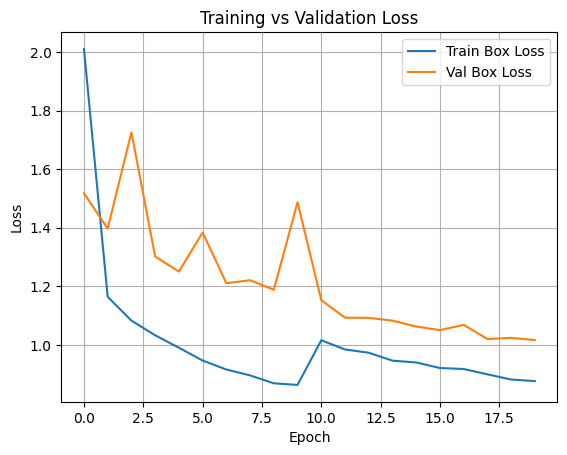

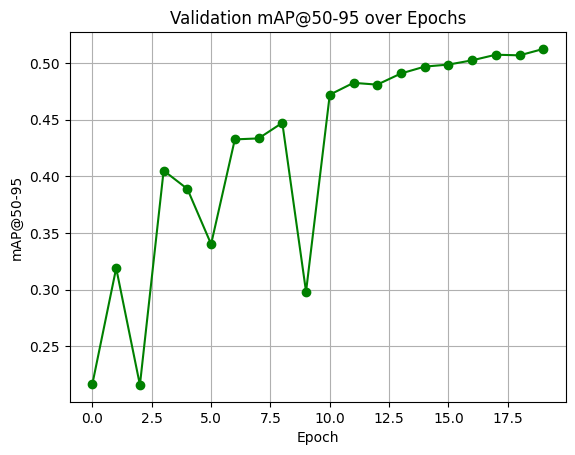

In [ ]:
import shutil
import pandas as pd
import matplotlib.pyplot as plt
import os

best_path = os.path.join(results_swin.save_dir, "weights", "best.pt")
shutil.copy(best_path, "/content/yolo_swin_final.pt")
print("Saved best model to /content/yolo_swin_final.pt")

csv_path = os.path.join(results_swin.save_dir, "results.csv")
df = pd.read_csv(csv_path)

df.columns = [c.strip() for c in df.columns]

train_loss = df['train/box_loss'].tolist()
val_loss   = df['val/box_loss'].tolist()
map50_95   = df['metrics/mAP50-95(B)'].tolist()

print("\nEpoch-wise Metrics:")
print("Epoch | Train Box Loss | Val Box Loss | mAP@50-95")
for i in range(len(train_loss)):
    print(f"{i+1:>5} | {train_loss[i]:>14.4f} | {val_loss[i]:>12.4f} | {map50_95[i]:>10.4f}")

plt.plot(train_loss, label='Train Box Loss')
plt.plot(val_loss, label='Val Box Loss')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

plt.plot(map50_95, marker='o', color='green')
plt.title("Validation mAP@50-95 over Epochs")
plt.xlabel("Epoch")
plt.ylabel("mAP@50-95")
plt.grid(True)
plt.show()


Compare YOLO Baseline vs SwinV2 mAP@50-95

In [ ]:
baseline_model = YOLO("/content/bestyolo.pt")
baseline_results = baseline_model.val(
    data="/content/fire_smoke.yaml",
    imgsz=160,
    batch=4,
    device="cuda" if torch.cuda.is_available() else "cpu"
)

baseline_map = baseline_results.results_dict["metrics/mAP50-95(B)"]

swin_map = map50_95[-1]

improvement = swin_map - baseline_map
print("\nAccuracy Improvement Summary (YOLO ➝ SwinV2):")
print(f"Baseline YOLO mAP@50-95    : {baseline_map:.4f}")
print(f"SwinV2 Fine-Tuned mAP@50-95: {swin_map:.4f}")
print(f"Improvement              : {improvement:.4f}")


Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1742.2±464.4 MB/s, size: 151.3 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 225/225 [00:08<00:00, 26.94it/s]


                   all        900       1644      0.674      0.558      0.608      0.464
                  fire        528        571      0.594      0.567      0.562      0.308
                 smoke        309        767      0.455      0.313      0.298       0.12
              non fire        306        306      0.972      0.793      0.964      0.964
Speed: 0.1ms preprocess, 3.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val2

Accuracy Improvement Summary (YOLO ➝ SwinV2):
Baseline YOLO mAP@50-95    : 0.4638
SwinV2 Fine-Tuned mAP@50-95: 0.5125
Improvement              : 0.0487


SimCLR-style Contrastive Learning with SwinV2 Encoder

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import matplotlib.pyplot as plt
import timm
import random

contrastive_transform = T.Compose([
    T.RandomResizedCrop(256),
    T.RandomHorizontalFlip(),
    T.ColorJitter(0.4, 0.4, 0.4, 0.1),
    T.RandomGrayscale(p=0.2),
    T.ToTensor()
])

class UnlabeledImageDataset(Dataset):
    def __init__(self, folder, limit=1000):
        all_images = [os.path.join(folder, f) for f in os.listdir(folder)
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        self.image_paths = random.sample(all_images, min(limit, len(all_images)))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert('RGB')
        return img

dataset_path = "/content/dataset/images/train"
contrastive_dataset = UnlabeledImageDataset(dataset_path, limit=1000)

def pil_collate(batch):
    return batch

contrastive_loader = DataLoader(
    contrastive_dataset, batch_size=32, shuffle=True, collate_fn=pil_collate
)

encoder = timm.create_model("swinv2_tiny_window8_256", pretrained=True, num_classes=0)
for p in encoder.parameters():
    p.requires_grad = False
encoder = encoder.to("cuda")

class ProjectionHead(nn.Module):
    def __init__(self, in_dim, out_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, 256),
            nn.ReLU(),
            nn.Linear(256, out_dim)
        )

    def forward(self, x):
        return self.net(x)

projector = ProjectionHead(in_dim=encoder.num_features).to("cuda")
optimizer = torch.optim.Adam(projector.parameters(), lr=3e-4)
temperature = 0.5

def nt_xent_loss(z1, z2, temperature=0.5):
    z = torch.cat([z1, z2], dim=0)
    sim = nn.functional.cosine_similarity(z.unsqueeze(1), z.unsqueeze(0), dim=2) / temperature

    N = z1.size(0)
    labels = torch.arange(N, device=z.device)
    labels = torch.cat([labels + N, labels], dim=0)

    sim_mask = torch.eye(2 * N, device=z.device) * 1e9
    sim = sim - sim_mask

    return nn.functional.cross_entropy(sim, labels)

contrastive_losses = []
for epoch in range(20):
    total_loss = 0
    for batch in contrastive_loader:
        x1 = torch.stack([contrastive_transform(img) for img in batch]).to("cuda")
        x2 = torch.stack([contrastive_transform(img) for img in batch]).to("cuda")

        with torch.no_grad():
            h1 = encoder(x1)
            h2 = encoder(x2)

        z1 = projector(h1)
        z2 = projector(h2)

        loss = nt_xent_loss(z1, z2, temperature)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(contrastive_loader)
    contrastive_losses.append(avg_loss)
    print(f"Epoch {epoch+1} | Contrastive Loss: {avg_loss:.4f}")


Epoch 1 | Contrastive Loss: 3.2989
Epoch 2 | Contrastive Loss: 3.0000
Epoch 3 | Contrastive Loss: 2.9277
Epoch 4 | Contrastive Loss: 2.8864
Epoch 5 | Contrastive Loss: 2.8649
Epoch 6 | Contrastive Loss: 2.8420
Epoch 7 | Contrastive Loss: 2.8170
Epoch 8 | Contrastive Loss: 2.7987
Epoch 9 | Contrastive Loss: 2.7844
Epoch 10 | Contrastive Loss: 2.7547
Epoch 11 | Contrastive Loss: 2.7646
Epoch 12 | Contrastive Loss: 2.7408
Epoch 13 | Contrastive Loss: 2.7454
Epoch 14 | Contrastive Loss: 2.7347
Epoch 15 | Contrastive Loss: 2.7414
Epoch 16 | Contrastive Loss: 2.7099
Epoch 17 | Contrastive Loss: 2.7098
Epoch 18 | Contrastive Loss: 2.6907
Epoch 19 | Contrastive Loss: 2.6924
Epoch 20 | Contrastive Loss: 2.6665


Plot Contrastive Loss and Save Projection Head

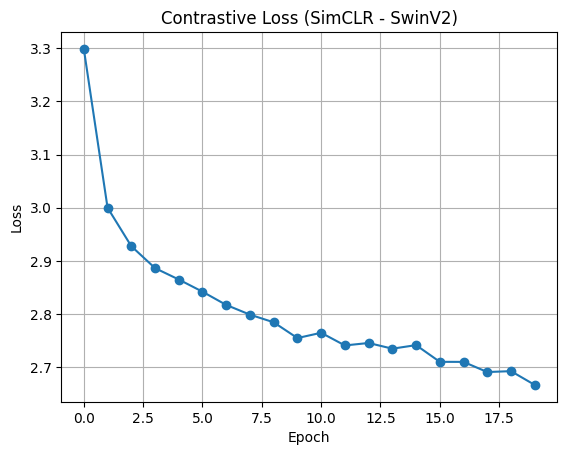

Projection head saved to: /content/projection_head_swinv2_contrastive.pt


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
plt.plot(contrastive_losses, marker='o')
plt.title("Contrastive Loss (SimCLR - SwinV2)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.show()

proj_path = "/content/projection_head_swinv2_contrastive.pt"
torch.save(projector.state_dict(), proj_path)
print(f"Projection head saved to: {proj_path}")

from google.colab import files
files.download(proj_path)


In [ ]:
proj_path = "/content/projection_head_contrastive.pt"
torch.save(projector.state_dict(), proj_path)
print(f"Projection head saved to {proj_path}")


Projection head saved to /content/projection_head_contrastive.pt


In [ ]:
from google.colab import files
files.download(proj_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import torch
import torch.nn as nn
from ultralytics import YOLO

device = "cuda" if torch.cuda.is_available() else "cpu"

model_C = YOLO("/content/yolo_swin_final.pt")
print("Loaded YOLO model with SwinV2 backbone.")

swin_backbone = model_C.model.model[0]
for param in swin_backbone.parameters():
    param.requires_grad = False
print("SwinV2 backbone frozen.")

class ProjectionHead(nn.Module):
    def __init__(self, in_dim=768, out_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, 256),
            nn.ReLU(),
            nn.Linear(256, out_dim)
        )

    def forward(self, x):
        return self.net(x)

proj = ProjectionHead().to(device)
proj.load_state_dict(torch.load("/content/projection_head_contrastive.pt"))
proj.eval()
print("Loaded and frozen contrastive-trained projection head.")

for name, param in model_C.model.named_parameters():
    if "model.0" in name:
        param.requires_grad = False
    else:
        param.requires_grad = True

print("Only YOLO head will be trained.")


Loaded YOLO model with SwinV2 backbone.
SwinV2 backbone frozen.
Loaded and frozen contrastive-trained projection head.
Only YOLO head will be trained.


In [ ]:
results_C = model_C.train(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    epochs=20,
    batch=8,
    lr0=1e-3,  
    device=device,
    project="runs/detect",
    name="StageC_FrozenSwin_Contrastive",
    verbose=True
)

Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo_swin_final.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=StageC_FrozenSwin_Contrastive, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective

100%|██████████| 755k/755k [00:00<00:00, 21.1MB/s]


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

Model summary: 129 layers, 11,136,761 parameters, 11,136,745 gradients, 28.7 GFLOPs

Transferred 355/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 91.6MB/s]
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:269: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:278: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::C

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 689.6±707.4 MB/s, size: 37.2 KB)


train: Scanning /content/dataset/labels/train... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:12<00:00, 591.80it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved


train: New cache created: /content/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 17.9±11.2 MB/s, size: 67.1 KB)


val: Scanning /content/dataset/labels/val... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:01<00:00, 489.04it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved


val: New cache created: /content/dataset/labels/val.cache
Plotting labels to runs/detect/StageC_FrozenSwin_Contrastive/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/StageC_FrozenSwin_Contrastive
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       1/20      1.62G      1.059     0.9538      1.478         47        224: 100%|██████████| 900/900 [01:40<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.729      0.633      0.679      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       2/20      1.67G     0.9478     0.9077      1.337         33        224: 100%|██████████| 900/900 [01:33<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.722      0.636      0.679      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       3/20       1.7G     0.9192     0.9023      1.308         25        224: 100%|██████████| 900/900 [01:31<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.668      0.584      0.658       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       4/20      1.74G     0.8975     0.8819      1.291         42        224: 100%|██████████| 900/900 [01:32<00:00,  9.75it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.733      0.635      0.679      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       5/20      1.78G     0.8871       0.88      1.282         37        224: 100%|██████████| 900/900 [01:32<00:00,  9.77it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.721      0.656      0.672      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       6/20      1.81G     0.8728     0.8574      1.269         29        224: 100%|██████████| 900/900 [01:32<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.725      0.672      0.696        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       7/20      1.85G     0.8541     0.8263      1.258         29        224: 100%|██████████| 900/900 [01:32<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.742      0.666      0.692      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       8/20      1.88G     0.8536      0.822      1.254         25        224: 100%|██████████| 900/900 [01:32<00:00,  9.71it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.719      0.674      0.693       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       9/20      1.92G     0.8287     0.7905      1.241         24        224: 100%|██████████| 900/900 [01:32<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.737      0.671      0.703      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      10/20      1.96G     0.8255     0.7782      1.233         22        224: 100%|██████████| 900/900 [01:33<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.731       0.67      0.708      0.508


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      11/20      1.99G     0.9581     0.7579      1.338         17        224: 100%|██████████| 900/900 [01:32<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.738      0.672      0.702      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      12/20      2.03G     0.9306     0.7282      1.317         11        224: 100%|██████████| 900/900 [01:31<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.732      0.679      0.698      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      13/20      2.07G     0.9117     0.7065        1.3          8        224: 100%|██████████| 900/900 [01:31<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.717      0.683      0.696      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      14/20       2.1G     0.9027     0.6904      1.291         13        224: 100%|██████████| 900/900 [01:30<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.743      0.687      0.714      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      15/20      2.14G     0.8863     0.6682      1.276         13        224: 100%|██████████| 900/900 [01:31<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.756      0.686      0.714      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      16/20      2.18G     0.8781     0.6508      1.279         16        224: 100%|██████████| 900/900 [01:30<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.769      0.697      0.723      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      17/20      2.21G     0.8625      0.636      1.263         14        224: 100%|██████████| 900/900 [01:33<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.769      0.698      0.724      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      18/20      2.25G     0.8502     0.6268      1.255         16        224: 100%|██████████| 900/900 [01:35<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.761      0.705      0.726      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      19/20      2.28G     0.8414     0.6051      1.241          8        224: 100%|██████████| 900/900 [01:31<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.757      0.711       0.73      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/900 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/utils/loss.py:209: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      20/20      2.32G      0.827     0.5953      1.232         15        224: 100%|██████████| 900/900 [01:31<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P        

                   all        900       1644      0.758      0.707      0.731       0.55



20 epochs completed in 0.553 hours.
Optimizer stripped from runs/detect/StageC_FrozenSwin_Contrastive/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/StageC_FrozenSwin_Contrastive/weights/best.pt, 22.5MB

Validating runs/detect/StageC_FrozenSwin_Contrastive/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:269: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:278: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this o

Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.24it/s]


                   all        900       1644      0.758      0.707      0.732       0.55
                  fire        528        571      0.739      0.694      0.743      0.445
                 smoke        309        767      0.592      0.435      0.459      0.212
               nonfire        306        306      0.944      0.993      0.993      0.993
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/StageC_FrozenSwin_Contrastive


In [ ]:
print("Available result keys:", results_C.results_dict.keys())

Available result keys: dict_keys(['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'fitness'])


In [ ]:
mAP_C = results_C.results_dict["metrics/mAP50-95(B)"]
print(f"\nStage C complete — mAP@50‑95: {mAP_C:.4f}")

final_model_path = "runs/detect/StageC_FrozenSwin_Contrastive/weights/best.pt"
save_path_C = "/content/yolo_swin_stageC_final.pt"
shutil.copy(final_model_path, save_path_C)
print(f"Stage C model saved to: {save_path_C}")

from google.colab import files
files.download(save_path_C)



Stage C complete — mAP@50‑95: 0.5499
Stage C model saved to: /content/yolo_swin_stageC_final.pt


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download("/content/yolo_swin_stageC_final.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
map_stage_b = 0.5125
map_stage_c = mAP_C
acc_improvement = map_stage_c - map_stage_b

print("\nAccuracy Improvement Summary (Stage B ➝ Stage C):")
print(f"SwinV2 YOLO (Stage B) mAP@50-95     : {map_stage_b:.4f}")
print(f"Contrastive YOLO (Stage C) mAP@50-95: {map_stage_c:.4f}")
print(f"Improvement                      : {acc_improvement:.4f}")



Accuracy Improvement Summary (Stage B ➝ Stage C):
SwinV2 YOLO (Stage B) mAP@50-95     : 0.5125
Contrastive YOLO (Stage C) mAP@50-95: 0.5499
Improvement                      : 0.0374


In [ ]:
from ultralytics import YOLO

swin_yolo_path = "/content/yolo_swin_stageC_final (1).pt"

model = YOLO(swin_yolo_path)
print("Swin + YOLO model loaded!")


Swin + YOLO model loaded!


Predict on Random Test Image Using Swin+YOLO Model


image 1/1 /content/dataset/images/test/WEB04967.jpg: 128x224 1 fire, 4 smokes, 68.0ms
Speed: 0.7ms preprocess, 68.0ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)


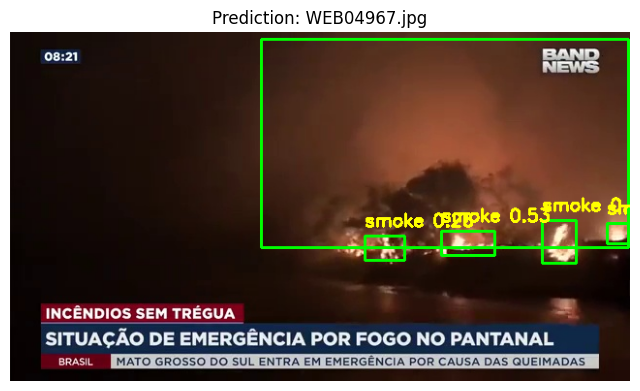

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/AoF05031.jpg: 128x224 1 smoke, 821.6ms
Speed: 11.6ms preprocess, 821.6ms inference, 78.3ms postprocess per image at shape (1, 3, 128, 224)


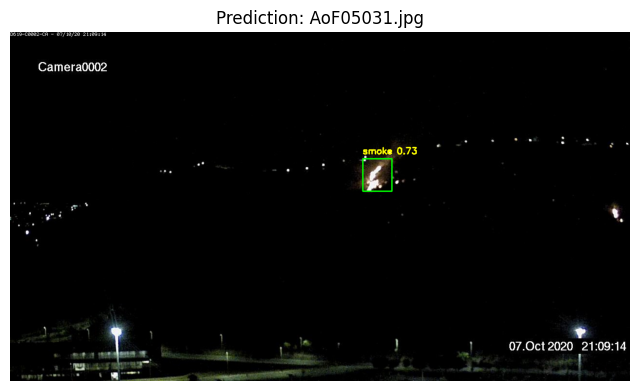

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/AoF05185.jpg: 128x224 (no detections), 69.1ms
Speed: 0.7ms preprocess, 69.1ms inference, 0.5ms postprocess per image at shape (1, 3, 128, 224)


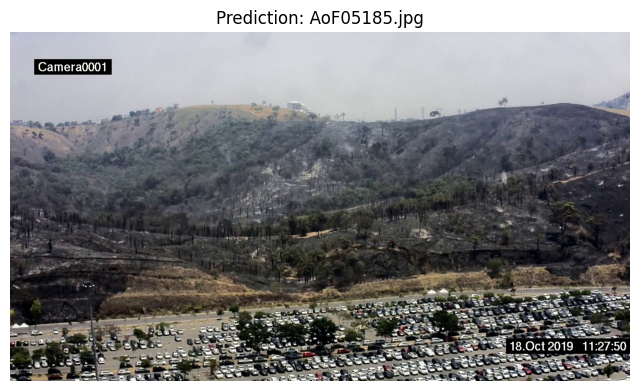

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/AoF04373.jpg: 128x224 1 smoke, 70.2ms
Speed: 0.7ms preprocess, 70.2ms inference, 0.9ms postprocess per image at shape (1, 3, 128, 224)


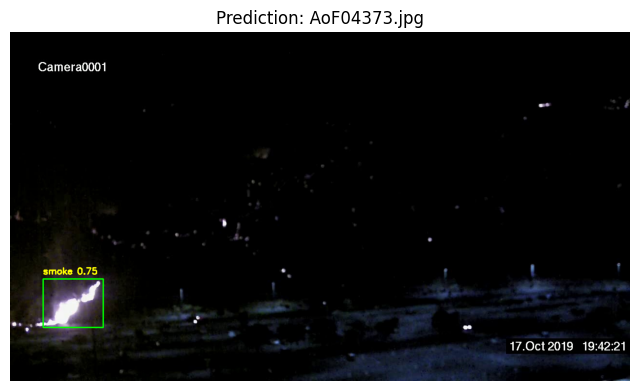

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/WEB07445.jpg: 128x224 1 fire, 2 smokes, 68.7ms
Speed: 0.9ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 128, 224)


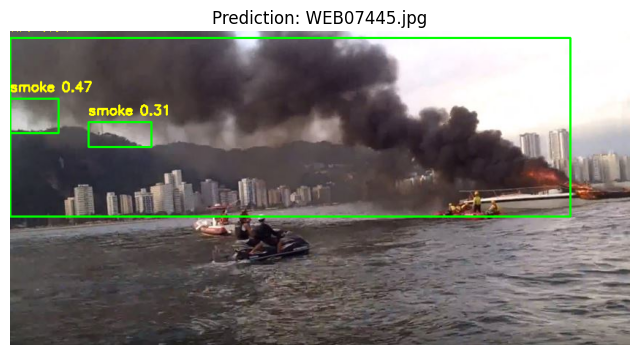

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/AoF04097.jpg: 128x224 1 smoke, 103.3ms
Speed: 1.0ms preprocess, 103.3ms inference, 1.2ms postprocess per image at shape (1, 3, 128, 224)


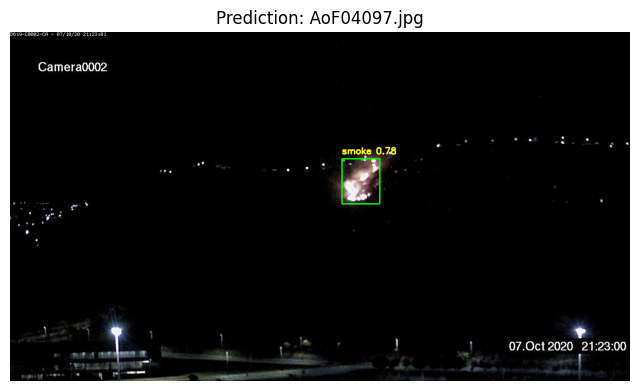

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/WEB09045.jpg: 224x128 1 fire, 1 smoke, 104.2ms
Speed: 0.9ms preprocess, 104.2ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 128)


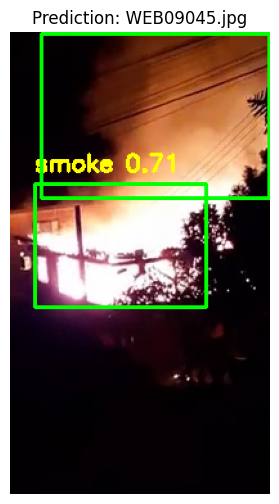

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()



image 1/1 /content/dataset/images/test/WEB05876.jpg: 128x224 1 fire, 5 smokes, 77.0ms
Speed: 0.8ms preprocess, 77.0ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)


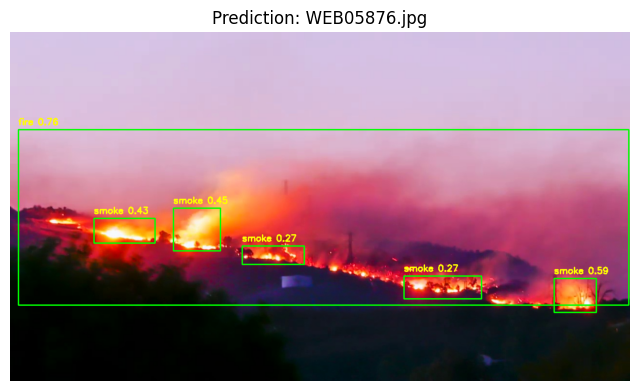

In [ ]:
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_img_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
               if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

img_path = random.choice(test_images)
result = model(img_path)[0]

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for box in result.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    conf = box.conf[0].item()
    cls = int(box.cls[0].item())
    label = model.names[cls]
    text = f"{label} {conf:.2f}"
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.title(f"Prediction: {os.path.basename(img_path)}")
plt.axis("off")
plt.show()


Bounding Box Prediction + Confidence Heatmap Visualization

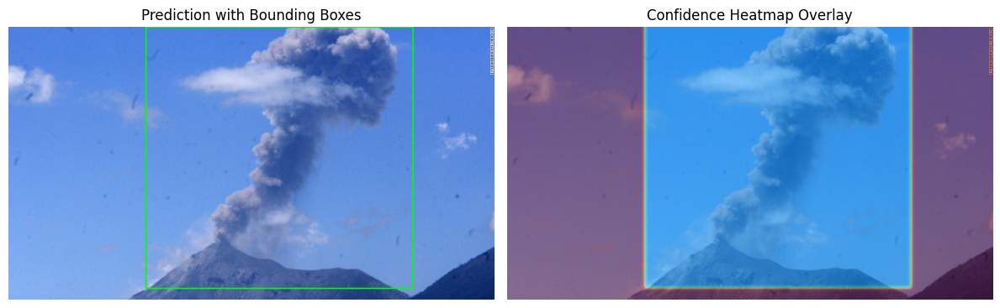

In [ ]:
import torch
import cv2
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_dir = "/content/dataset/images/test"
test_imgs = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith((".jpg", ".png"))]
img_path = random.choice(test_imgs)

results = model(img_path, verbose=False)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]

heatmap = np.zeros((h, w), dtype=np.float32)

for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    score = float(box.conf[0])
    heatmap[y1:y2, x1:x2] += score

heatmap = np.clip(heatmap, 0, 1)
heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
heatmap_overlay = cv2.addWeighted(image, 0.6, heatmap_color, 0.4, 0)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
img_copy = image.copy()
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    cls = int(box.cls[0].item())
    conf = float(box.conf[0])
    label = f"{model.names[cls]} {conf:.2f}"
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
plt.imshow(img_copy)
plt.title("Prediction with Bounding Boxes")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(heatmap_overlay)
plt.title("Confidence Heatmap Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


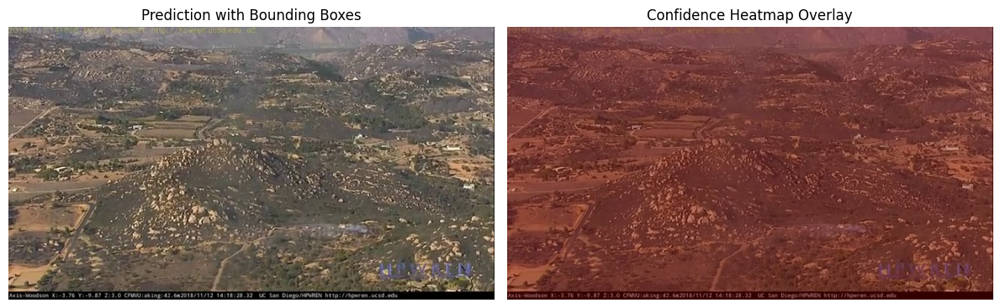

In [ ]:
import torch
import cv2
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_dir = "/content/dataset/images/test"
test_imgs = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith((".jpg", ".png"))]
img_path = random.choice(test_imgs)

results = model(img_path, verbose=False)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]

heatmap = np.zeros((h, w), dtype=np.float32)

for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    score = float(box.conf[0])
    heatmap[y1:y2, x1:x2] += score

heatmap = np.clip(heatmap, 0, 1)
heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
heatmap_overlay = cv2.addWeighted(image, 0.6, heatmap_color, 0.4, 0)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
img_copy = image.copy()
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    cls = int(box.cls[0].item())
    conf = float(box.conf[0])
    label = f"{model.names[cls]} {conf:.2f}"
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
plt.imshow(img_copy)
plt.title("Prediction with Bounding Boxes")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(heatmap_overlay)
plt.title("Confidence Heatmap Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


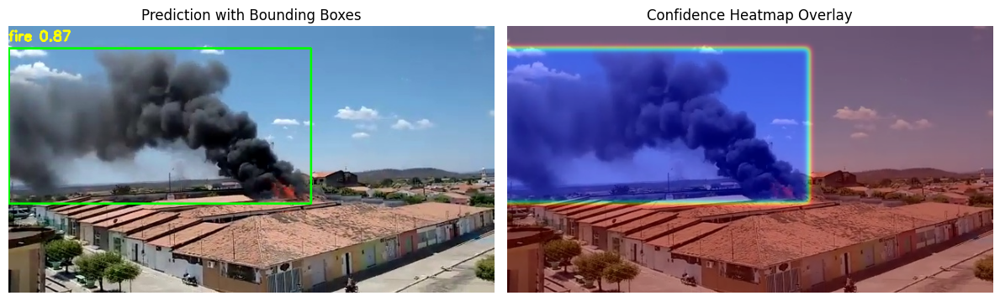

In [ ]:
import torch
import cv2
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_dir = "/content/dataset/images/test"
test_imgs = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith((".jpg", ".png"))]
img_path = random.choice(test_imgs)

results = model(img_path, verbose=False)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]

heatmap = np.zeros((h, w), dtype=np.float32)

for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    score = float(box.conf[0])
    heatmap[y1:y2, x1:x2] += score

heatmap = np.clip(heatmap, 0, 1)
heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
heatmap_overlay = cv2.addWeighted(image, 0.6, heatmap_color, 0.4, 0)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
img_copy = image.copy()
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    cls = int(box.cls[0].item())
    conf = float(box.conf[0])
    label = f"{model.names[cls]} {conf:.2f}"
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
plt.imshow(img_copy)
plt.title("Prediction with Bounding Boxes")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(heatmap_overlay)
plt.title("Confidence Heatmap Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


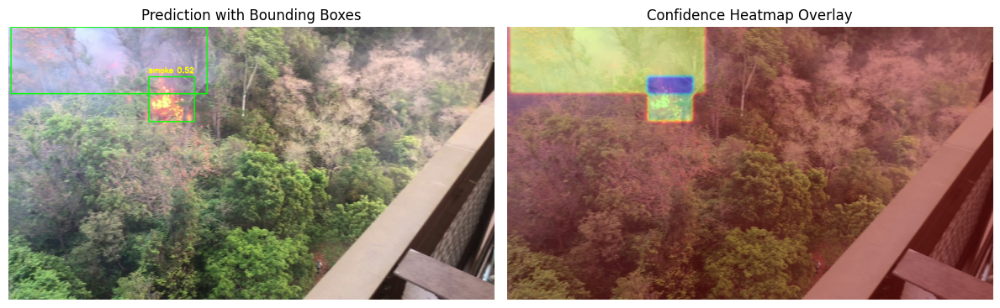

In [ ]:
import torch
import cv2
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")

test_dir = "/content/dataset/images/test"
test_imgs = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith((".jpg", ".png"))]
img_path = random.choice(test_imgs)

results = model(img_path, verbose=False)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]

heatmap = np.zeros((h, w), dtype=np.float32)

for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    score = float(box.conf[0])
    heatmap[y1:y2, x1:x2] += score

heatmap = np.clip(heatmap, 0, 1)
heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
heatmap_overlay = cv2.addWeighted(image, 0.6, heatmap_color, 0.4, 0)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
img_copy = image.copy()
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
    cls = int(box.cls[0].item())
    conf = float(box.conf[0])
    label = f"{model.names[cls]} {conf:.2f}"
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
plt.imshow(img_copy)
plt.title("Prediction with Bounding Boxes")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(heatmap_overlay)
plt.title("Confidence Heatmap Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


Run BLIP + Swin-YOLO Predictions on Random 20 Test Images


image 1/1 /content/dataset/images/test/WEB04280.jpg: 192x224 1 fire, 7 smokes, 272.6ms
Speed: 1.1ms preprocess, 272.6ms inference, 1.4ms postprocess per image at shape (1, 3, 192, 224)

image 1/1 /content/dataset/images/test/WEB03801.jpg: 128x224 1 fire, 3 smokes, 101.2ms
Speed: 1.1ms preprocess, 101.2ms inference, 1.2ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/WEB07038.jpg: 128x224 1 fire, 66.0ms
Speed: 0.7ms preprocess, 66.0ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/WEB06469.jpg: 128x224 1 fire, 67.3ms
Speed: 0.8ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04412.jpg: 128x224 2 fires, 65.5ms
Speed: 0.8ms preprocess, 65.5ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/WEB04147.jpg: 160x224 1 fire, 4 smokes, 127.0ms
Speed: 1.1ms prep

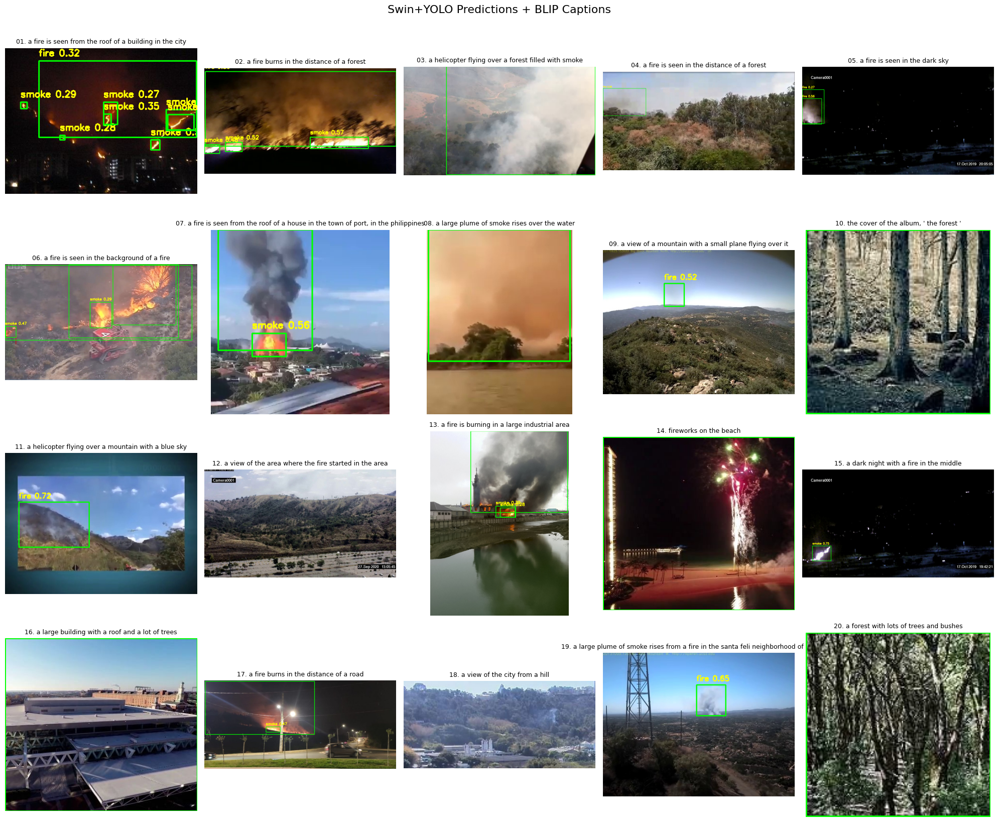

In [ ]:
import random, os, cv2, torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

swin_yolo = YOLO("/content/yolo_swin_stageC_final (1).pt")

device = "cuda" if torch.cuda.is_available() else "cpu"
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

test_dir = "/content/dataset/images/test"
test_images = [os.path.join(test_dir, f) for f in os.listdir(test_dir)
               if f.lower().endswith((".jpg", ".jpeg", ".png"))]
sampled_images = random.sample(test_images, 20)

plt.figure(figsize=(20, 16))
for idx, img_path in enumerate(sampled_images, 1):
    results = swin_yolo(img_path)[0]
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        conf = float(box.conf[0])
        cls = int(box.cls[0])
        label = swin_yolo.names[cls]
        text = f"{label} {conf:.2f}"
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, text, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

    pil_image = Image.open(img_path).convert("RGB")
    inputs = processor(pil_image, return_tensors="pt").to(device)
    out = blip_model.generate(**inputs)
    caption = processor.decode(out[0], skip_special_tokens=True)

    plt.subplot(4, 5, idx)
    plt.imshow(image)
    plt.title(f"{idx:02d}. {caption}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.suptitle("Swin+YOLO Predictions + BLIP Captions", fontsize=16, y=1.02)
plt.show()


Run BLIP + Swin-YOLO Predictions on first 20 Test Images

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]


image 1/1 /content/dataset/images/test/AoF04025.jpg: 128x224 1 fire, 3 smokes, 445.4ms
Speed: 14.5ms preprocess, 445.4ms inference, 58.1ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04032.jpg: 128x224 1 fire, 5 smokes, 57.8ms
Speed: 0.8ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04050.jpg: 128x224 1 fire, 3 smokes, 64.0ms
Speed: 0.8ms preprocess, 64.0ms inference, 1.1ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04097.jpg: 128x224 1 smoke, 64.6ms
Speed: 0.7ms preprocess, 64.6ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04148.jpg: 128x224 1 smoke, 89.6ms
Speed: 1.0ms preprocess, 89.6ms inference, 1.2ms postprocess per image at shape (1, 3, 128, 224)

image 1/1 /content/dataset/images/test/AoF04162.jpg: 128x224 1 fire, 1 smoke, 66.6ms
Speed: 1

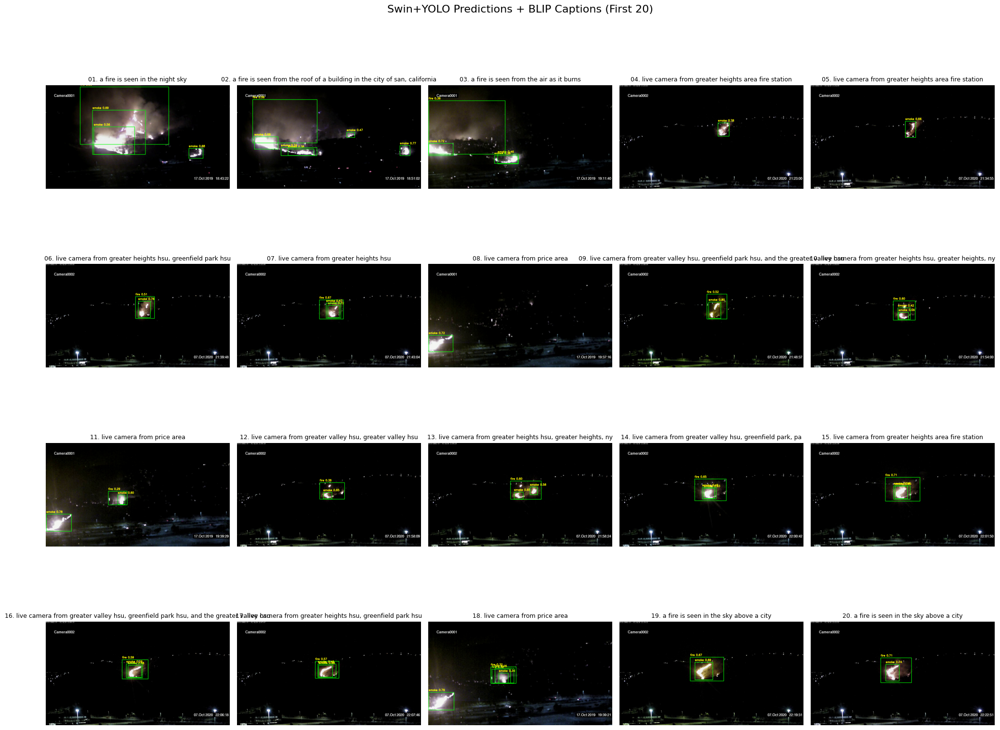

In [ ]:
import os, cv2, torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration
from glob import glob

swin_yolo = YOLO("/content/yolo_swin_stageC_final (1).pt")

device = "cuda" if torch.cuda.is_available() else "cpu"
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

test_dir = "/content/dataset/images/test"
test_images = sorted(glob(f"{test_dir}/*.jpg"))[:20]

plt.figure(figsize=(20, 16))
for idx, img_path in enumerate(test_images, 1):
    results = swin_yolo(img_path)[0]
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        conf = float(box.conf[0])
        cls = int(box.cls[0])
        label = swin_yolo.names[cls]
        text = f"{label} {conf:.2f}"
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, text, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

    pil_image = Image.open(img_path).convert("RGB")
    inputs = processor(pil_image, return_tensors="pt").to(device)
    out = blip_model.generate(**inputs)
    caption = processor.decode(out[0], skip_special_tokens=True)

    plt.subplot(4, 5, idx)
    plt.imshow(image)
    plt.title(f"{idx:02d}. {caption}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.suptitle("Swin+YOLO Predictions + BLIP Captions (First 20)", fontsize=16, y=1.02)
plt.show()


Run CLIP Predictions on First 20 Test Images

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.4 MB/s eta 0:00:00


100%|███████████████████████████████████████| 338M/338M [00:03<00:00, 96.5MiB/s]


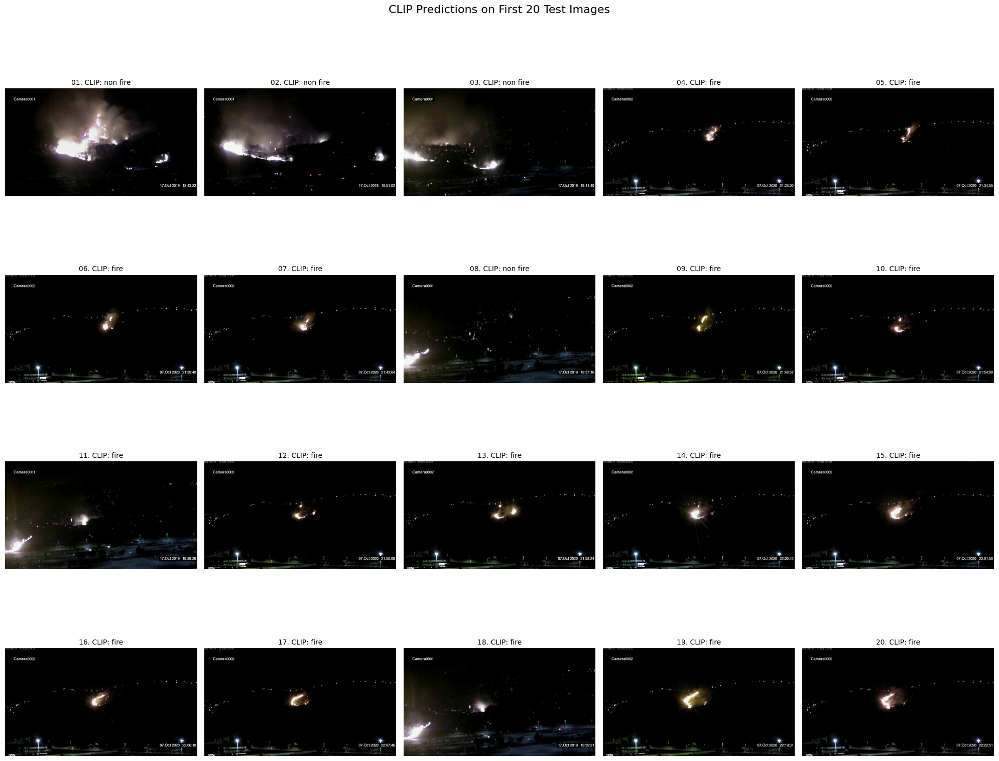

In [ ]:
!pip install -q git+https://github.com/openai/CLIP.git

import clip
import torch
from PIL import Image
import os
from glob import glob
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device)

class_names = ["fire", "smoke", "non fire"]
text_tokens = clip.tokenize(class_names).to(device)

test_dir = "/content/dataset/images/test"
test_images = sorted(glob(f"{test_dir}/*.jpg"))[:20]

clip_results = []

for img_path in test_images:
    image = Image.open(img_path).convert("RGB")
    processed = preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = clip_model.encode_image(processed)
        text_features = clip_model.encode_text(text_tokens)

        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        similarity = (image_features @ text_features.T).squeeze(0)
        pred_label = class_names[similarity.argmax().item()]

    clip_results.append((image, pred_label))

plt.figure(figsize=(20, 16))
for i, (img, label) in enumerate(clip_results, start=1):
    plt.subplot(4, 5, i)
    plt.imshow(img)
    plt.title(f"{i:02d}. CLIP: {label}", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.suptitle("CLIP Predictions on First 20 Test Images", fontsize=16, y=1.02)
plt.show()
